In [ ]:
!wget https://github.com/dongjxjx/dwdn/raw/main/median_pool.py

--2023-02-18 15:45:16--  https://github.com/dongjxjx/dwdn/raw/main/median_pool.py
Resolving github.com (github.com)... 140.82.121.4
Connecting to github.com (github.com)|140.82.121.4|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/dongjxjx/dwdn/main/median_pool.py [following]
--2023-02-18 15:45:16--  https://raw.githubusercontent.com/dongjxjx/dwdn/main/median_pool.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 1870 (1.8K) [text/plain]
Saving to: ‘median_pool.py’

median_pool.py      100%[===================>]   1.83K  --.-KB/s    in 0s      

2023-02-18 15:45:17 (34.9 MB/s) - ‘median_pool.py’ saved [1870/1870]



In [ ]:
!wget https://github.com/cszn/KAIR/raw/master/utils/utils_image.py

--2023-02-18 15:45:19--  https://github.com/cszn/KAIR/raw/master/utils/utils_image.py
Resolving github.com (github.com)... 140.82.121.3
Connecting to github.com (github.com)|140.82.121.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://raw.githubusercontent.com/cszn/KAIR/master/utils/utils_image.py [following]
--2023-02-18 15:45:20--  https://raw.githubusercontent.com/cszn/KAIR/master/utils/utils_image.py
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.111.133, 185.199.110.133, 185.199.108.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.111.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 33134 (32K) [text/plain]
Saving to: ‘utils_image.py’

utils_image.py      100%[===================>]  32.36K  --.-KB/s    in 0s      

2023-02-18 15:45:20 (71.0 MB/s) - ‘utils_image.py’ saved [33134/33134]



In [ ]:
!wget -O "files.zip" "https://drive.google.com/uc?id=1rv4-nDY1ghfjtrbzonfa5GAd_5ekKwhT&confirm=t"

--2023-02-18 15:45:21--  https://drive.google.com/uc?id=1rv4-nDY1ghfjtrbzonfa5GAd_5ekKwhT&confirm=t
Resolving drive.google.com (drive.google.com)... 74.125.128.138, 74.125.128.101, 74.125.128.102, ...
Connecting to drive.google.com (drive.google.com)|74.125.128.138|:443... connected.
HTTP request sent, awaiting response... 303 See Other
Location: https://doc-14-8c-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/kcfpdnls5lnofsag1u9seorkp1bkr3j0/1676735100000/00525767206999195335/*/1rv4-nDY1ghfjtrbzonfa5GAd_5ekKwhT?uuid=e30cb500-7672-4b13-835f-e6ef5143a347 [following]
--2023-02-18 15:45:22--  https://doc-14-8c-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/kcfpdnls5lnofsag1u9seorkp1bkr3j0/1676735100000/00525767206999195335/*/1rv4-nDY1ghfjtrbzonfa5GAd_5ekKwhT?uuid=e30cb500-7672-4b13-835f-e6ef5143a347
Resolving doc-14-8c-docs.googleusercontent.com (doc-14-8c-docs.googleusercontent.com)... 108.177.119.132, 2a00:1450:4013:c00::84
Connectin

In [ ]:
# !zip -FF files.zip --out repaired-files.zip
!7z x files.zip


7-Zip [64] 16.02 : Copyright (c) 1999-2016 Igor Pavlov : 2016-05-21
p7zip Version 16.02 (locale=en_US.UTF-8,Utf16=on,HugeFiles=on,64 bits,2 CPUs Intel(R) Xeon(R) CPU @ 2.00GHz (50653),ASM,AES-NI)

Scanning the drive for archives:
  0M Scan         1 file, 5397285745 bytes (5148 MiB)

Extracting archive: files.zip
  2% 256 Open               5% 512 Open               8% 768 Open              10% 1024 Open               13% 1280 Open               16% 1536 Open               18% 1792 Open               21% 2048 Open               24% 2304 Open               26% 2560 Open               29% 2816 Open               32% 3072 Open               37% 3

In [ ]:
!ls DIV2K_Ensemble_LR/ | wc -l

2700


#### imports 

In [ ]:
import torch
import torchvision
import torch.nn as nn
from torchvision import transforms
from torch.autograd import Variable
from torchvision.io import read_image
from torch.utils.data import Dataset, DataLoader

import os, glob
import numpy as np
import random, csv
import matplotlib.pyplot as plt
import utils_image as util
from PIL import Image
from glob import glob
from tqdm.auto import tqdm
from skimage import color, restoration

In [ ]:
plt.rcParams["figure.figsize"] = (20,15)

# Check a sample

## Low-Resolution Image after Applying filter

Image data:
 tensor([[[ 72,  93,  85,  ...,  22,  19,  13],
         [ 74,  94,  87,  ...,  20,  19,  13],
         [ 76,  98,  96,  ...,  20,  20,  15],
         ...,
         [ 21,  28,  31,  ..., 104,  64,  28],
         [ 22,  32,  40,  ...,  65,  37,  21],
         [ 28,  42,  46,  ...,  42,  30,  21]],

        [[ 58,  74,  65,  ...,   6,   6,   4],
         [ 58,  74,  69,  ...,   5,   6,   5],
         [ 59,  78,  77,  ...,   7,   6,   4],
         ...,
         [ 12,  15,  18,  ...,  85,  49,  20],
         [ 11,  17,  28,  ...,  52,  28,  14],
         [ 23,  33,  35,  ...,  28,  19,  12]],

        [[ 56,  70,  62,  ...,   2,   1,   0],
         [ 57,  77,  77,  ...,   1,   1,   1],
         [ 64,  85,  83,  ...,   1,   1,   1],
         ...,
         [  3,   7,  16,  ...,  55,  21,   5],
         [  6,  12,  26,  ...,  21,   5,   0],
         [ 15,  27,  33,  ...,   6,   2,   1]]], dtype=torch.uint8)
torch.Size([3, 468, 680])


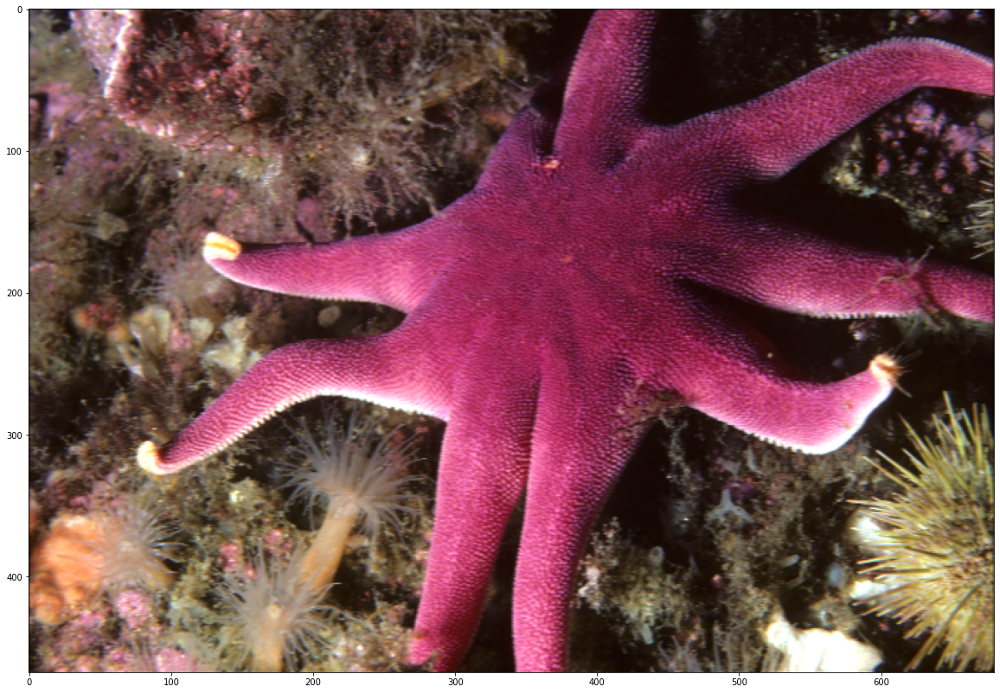

In [ ]:
y_img = read_image('DIV2K_Ensemble_LR/0001_Set__kernel_1.png')
print("Image data:\n", y_img)
plt.imshow(y_img.permute(1, 2, 0))
print(y_img.size())

## Low-Resolution Image before Applying filter

Image data:
 tensor([[[80, 82, 67,  ..., 18, 15, 14],
         [87, 80, 67,  ..., 17, 17, 14],
         [87, 83, 73,  ..., 14, 18, 16],
         ...,
         [25, 23, 20,  ..., 92, 40, 24],
         [23, 27, 25,  ..., 38, 25, 23],
         [27, 37, 38,  ..., 27, 24, 23]],

        [[65, 67, 50,  ...,  4,  4,  5],
         [69, 62, 54,  ...,  3,  6,  5],
         [66, 67, 59,  ...,  5,  6,  4],
         ...,
         [15, 11, 10,  ..., 73, 30, 15],
         [12, 11, 17,  ..., 32, 19, 14],
         [22, 31, 28,  ..., 18, 15, 13]],

        [[66, 56, 49,  ...,  1,  0,  0],
         [65, 64, 63,  ...,  0,  2,  0],
         [72, 73, 67,  ...,  0,  2,  0],
         ...,
         [ 4,  2, 12,  ..., 43,  0,  5],
         [ 5,  7, 18,  ...,  8,  0,  0],
         [ 9, 26, 27,  ...,  1,  2,  2]]], dtype=torch.uint8)
torch.Size([3, 468, 680])


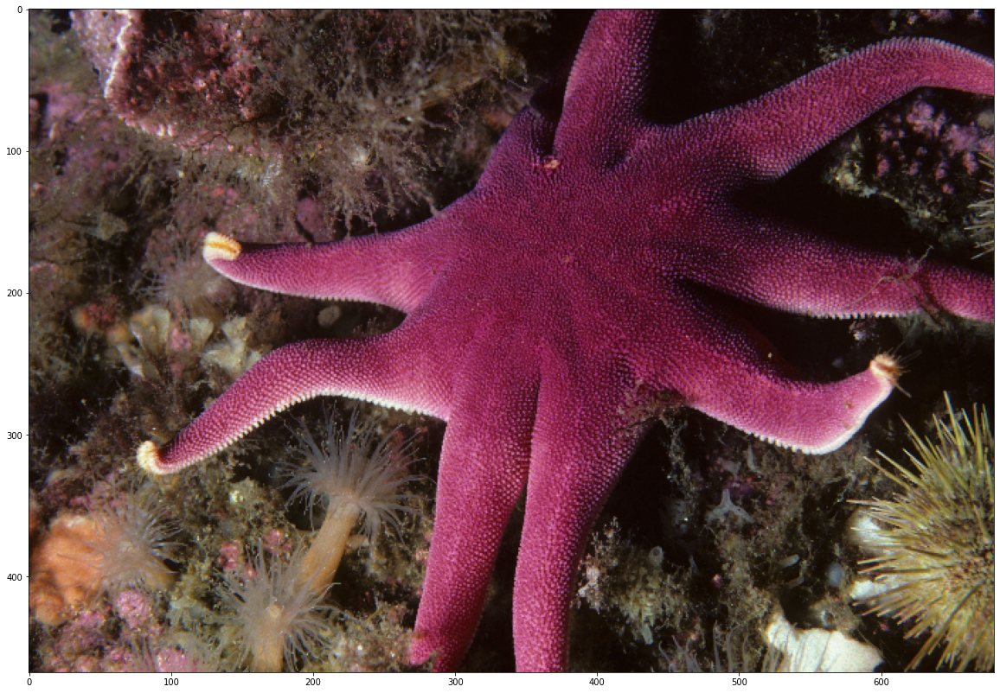

In [ ]:
p_img = read_image('DIV2K_Ensemble_GRND/0001_Set_Kernel_1.png')
print("Image data:\n", p_img)
plt.imshow(p_img.permute(1, 2, 0))
print(p_img.size())

#### crop ####

In [ ]:
from glob import glob

print(f'{len(glob("DIV2K_Ensemble_LR/*"))=}')
print(f'{len(glob("DIV2K_Ensemble_GRND/*"))=}')

len(glob("DIV2K_Ensemble_LR/*"))=2700
len(glob("DIV2K_Ensemble_GRND/*"))=4800


In [ ]:
class DatasetSR(Dataset):
    '''
    # -----------------------------------------
    # Get L/H for SISR.
    # If only "paths_H" is provided, sythesize bicubicly downsampled L on-the-fly.
    # -----------------------------------------
    # e.g., SRResNet
    # -----------------------------------------
    '''
    def __init__(self):
        super(DatasetSR, self).__init__()
        self.n_channels = 3
        self.sf = 1
        self.patch_size = 96
        self.L_size = self.patch_size // self.sf
        # ------------------------------------
        # get paths of L/H
        # ------------------------------------
        self.paths_H = util.get_image_paths('DIV2K_Ensemble_GRND')[:2500]
        self.paths_L = util.get_image_paths('DIV2K_Ensemble_LR')[:2500]
        '''
        assert self.paths_H, 'Error: H path is empty.'
        if self.paths_L and self.paths_H:
            assert len(self.paths_L) == len(self.paths_H), 'L/H mismatch - {}, {}.'.format(len(self.paths_L), len(self.paths_H))
        '''
    def __getitem__(self, index):
        H_path = None
        # ------------------------------------
        # get H image
        # ------------------------------------
        L_path = self.paths_L[index]
        img_L = util.imread_uint(L_path, self.n_channels)
        img_L = util.uint2single(img_L)
        # ------------------------------------
        # modcrop
        # ------------------------------------
        # ------------------------------------
        # get L image
        # ------------------------------------
        if self.paths_H:
            # --------------------------------
            # directly load L image
            # --------------------------------
            H_path = self.paths_H[index]
            img_H = util.imread_uint(H_path, self.n_channels)
            img_H = util.uint2single(img_H)
            img_H = util.modcrop(img_H, self.sf)
        else:
            # --------------------------------
            # sythesize L image via matlab's bicubic
            # --------------------------------
            H, W = img_H.shape[:2]
            # img_L = util.imresize_np(img_H, 1 / self.sf, True)
        # ------------------------------------
        # if train, get L/H patch pair
        # ------------------------------------
        H, W, C = img_L.shape
        # --------------------------------
        # randomly crop the L patch
        # --------------------------------
        rnd_h = random.randint(0, max(0, H - self.L_size))
        rnd_w = random.randint(0, max(0, W - self.L_size))
        img_L = img_L[rnd_h:rnd_h + self.L_size, rnd_w:rnd_w + self.L_size, :]
        # --------------------------------
        # crop corresponding H patch
        # --------------------------------
        # rnd_h_H, rnd_w_H = int(rnd_h * self.sf), int(rnd_w * self.sf)
        # img_H = img_H[rnd_h_H:rnd_h_H + self.patch_size, rnd_w_H:rnd_w_H + self.patch_size, :]
        img_H = img_H[rnd_h:rnd_h + self.L_size, rnd_w:rnd_w + self.L_size, :]

        # --------------------------------
        # augmentation - flip and/or rotate
        # --------------------------------
        # mode = random.randint(0, 7)
        # img_L, img_H = util.augment_img(img_L, mode=mode), util.augment_img(img_H, mode=mode)
        # ------------------------------------
        # L/H pairs, HWC to CHW, numpy to tensor
        # ------------------------------------
        # img_L = img_L.copy()
        # img_H =img_H.copy()
        img_H, img_L = util.single2tensor3(img_H), util.single2tensor3(img_L)

#         giving the label as the kernel used :
        L_label = L_path[len(L_path)-5]
        if L_path is None:
            L_path = H_path
        return {'L': img_L, 'H': img_H, 'L_path': L_path, 'H_path': H_path,'L_label': L_label}
    def __len__(self):
        return len(self.paths_L)

In [ ]:
###creating of the datasets 

#Set Device to Cuda
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

dataset = DatasetSR()
dataloader = DataLoader(dataset, batch_size=16, shuffle=False)
length = len(dataset)
print(length)
##test for the LR label 
for data in dataloader:
    train_data = data['L']
    break   


cuda:0
2500


In [ ]:
for sample in dataloader:
    print(f'{sample["L"].size()}')
    print(f'{sample["L_path"]}')
    print(f'{sample["H"].size()}')
    print(f'{sample["H_path"]}')
    print(f'{sample["L_label"]}')
    break

torch.Size([16, 3, 96, 96])
['DIV2K_Ensemble_LR/0001_Set__kernel_1.png', 'DIV2K_Ensemble_LR/0001_Set__kernel_2.png', 'DIV2K_Ensemble_LR/0001_Set__kernel_3.png', 'DIV2K_Ensemble_LR/0001_Set__kernel_4.png', 'DIV2K_Ensemble_LR/0001_Set__kernel_5.png', 'DIV2K_Ensemble_LR/0001_Set__kernel_6.png', 'DIV2K_Ensemble_LR/0002_Set__kernel_1.png', 'DIV2K_Ensemble_LR/0002_Set__kernel_2.png', 'DIV2K_Ensemble_LR/0002_Set__kernel_3.png', 'DIV2K_Ensemble_LR/0002_Set__kernel_4.png', 'DIV2K_Ensemble_LR/0002_Set__kernel_5.png', 'DIV2K_Ensemble_LR/0002_Set__kernel_6.png', 'DIV2K_Ensemble_LR/0003_Set__kernel_1.png', 'DIV2K_Ensemble_LR/0003_Set__kernel_2.png', 'DIV2K_Ensemble_LR/0003_Set__kernel_3.png', 'DIV2K_Ensemble_LR/0003_Set__kernel_4.png']
torch.Size([16, 3, 96, 96])
['DIV2K_Ensemble_GRND/0001_Set_Kernel_1.png', 'DIV2K_Ensemble_GRND/0001_Set_kernel_2.png', 'DIV2K_Ensemble_GRND/0001_Set_kernel_3.png', 'DIV2K_Ensemble_GRND/0001_Set_kernel_4.png', 'DIV2K_Ensemble_GRND/0001_Set_kernel_5.png', 'DIV2K_Ensemb

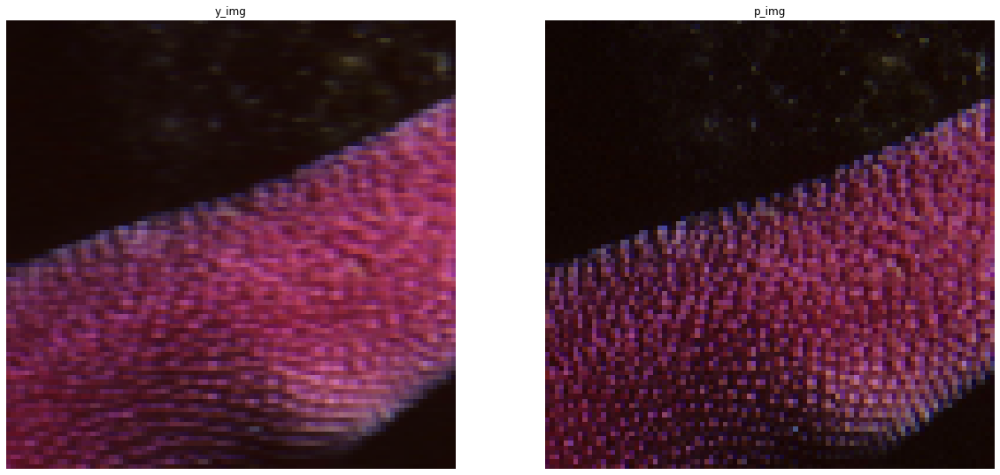

In [ ]:
for data in dataloader:
    plt.subplot(1, 2, 1)
    plt.title('y_img')
    plt.axis(False)
    plt.imshow(data['L'][0].permute(1, 2, 0))
    plt.subplot(1, 2, 2)
    plt.title('p_img')
    plt.axis(False)
    plt.imshow(data['H'][0].permute(1, 2, 0))
    break

In [ ]:
###Residual block ######

class BasicResidualBlock(nn.Module): 
    def __init__(self,channel_num):
        super(BasicResidualBlock,self).__init__()
        ## 3 * 3 kernel conv 
        #input and output channels == channel_num
        self.conv_block1 = nn.Sequential(nn.Conv2d(channel_num, channel_num ,3, padding=1),
                                         nn.BatchNorm2d(channel_num),
                                         nn.ReLU())
        self.conv_block2 = nn.Sequential(nn.Conv2d(channel_num, channel_num, 3, padding=1),
                                         nn.BatchNorm2d(channel_num))
        # self.relu = nn.ReLU()
        # self.maxpool = torch.nn.MaxPool2d(kernel_size = 3,padding = 1)
		 
              
    def forward(self,x): 
          
            ##forward 
            residual = x
            x = self.conv_block1(x)
            x = self.conv_block2(x)
            x = x + residual 
            # x = self.relu(x)
            # out = self.maxpool(x)
           
            return x 

In [ ]:
##Functional KES net 

class KES_Net(torch.nn.Module):
    def __init__(self):
        super(KES_Net, self).__init__()
        
        ##first block is the convolution ---size of 
        self.block_1 = nn.Sequential(nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1),
                                    nn.BatchNorm2d(64),
                                    nn.ReLU())
        
        self.res_blocks_1 = nn.ModuleList([BasicResidualBlock(channel_num=64) for i in range(2)])
        self.res_blocks_2 = nn.ModuleList([BasicResidualBlock(channel_num=64) for i in range(2)])
        self.res_blocks_3 = nn.ModuleList([BasicResidualBlock(channel_num=64) for i in range(2)])
        self.res_blocks_4 = nn.ModuleList([BasicResidualBlock(channel_num=64) for i in range(2)])
        
        self.maxpool_1 = torch.nn.MaxPool2d(kernel_size=3, padding=1)
        self.maxpool_2 = torch.nn.MaxPool2d(kernel_size=3, padding=1)
        self.maxpool_3 = torch.nn.MaxPool2d(kernel_size=3, padding=1)

        self.global_avgpool_1 = torch.nn.AdaptiveAvgPool2d(1)

        self.pw_block_1 = torch.nn.Sequential(torch.nn.Conv2d(in_channels=64, out_channels=256, kernel_size=1),
                                               torch.nn.BatchNorm2d(256),
                                               torch.nn.ReLU())
        
        self.pw_block_2 = torch.nn.Sequential(torch.nn.Conv2d(in_channels=256, out_channels=128, kernel_size=1),
                                               torch.nn.BatchNorm2d(128),
                                               torch.nn.ReLU())
        
        self.pw_block_3 = torch.nn.Sequential(torch.nn.Conv2d(in_channels=128, out_channels=121, kernel_size=1),
                                              torch.nn.BatchNorm2d(121),
                                              torch.nn.Sigmoid())
        # self.fc2 = nn.Linear(121,1)
        
    def forward(self,x):
        x = self.block_1(x)
        
        for res_block in self.res_blocks_1:
            x = res_block(x)

        x = self.maxpool_1(x)

        for res_block in self.res_blocks_2:
            x = res_block(x)

        x = self.maxpool_2(x)

        for res_block in self.res_blocks_3:
            x = res_block(x)

        x = self.maxpool_3(x)

        for res_block in self.res_blocks_4:
            x = res_block(x)

        x = self.global_avgpool_1(x)

        x = self.pw_block_1(x)
        x = self.pw_block_2(x)
        x = self.pw_block_3(x)

    #     x = self.block_1(x)
    #     for i, __ in enumerate(self.BasicResidualBlock):
    #         x = self.BasicResidualBlock[i](x)
    #    ##global average pooling  
    #     #x = x.mean(dim=(-2, -1))
            
    #     x = self.block_3(x)
    #     x = self.block_4(x)
    #     x = self.block_5(x)
    #     # x = self.fc2(x)
        
        return x

In [ ]:
from torch.optim.lr_scheduler import MultiStepLR
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
model = KES_Net()
model.to(device)

# error = nn.L1Loss()

learning_rate = 1e-7
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate) # Code to use the Adam Optimizer
#optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)
# scheduler = MultiStepLR(optimizer, milestones=[100000, 160000, 180000, 192000, 200000], gamma=0.5) #milestones=[Intended Epoch * Batch Size]
print(model)

cuda:0
KES_Net(
  (block_1): Sequential(
    (0): Conv2d(3, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (res_blocks_1): ModuleList(
    (0): BasicResidualBlock(
      (conv_block1): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
      )
      (conv_block2): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      )
    )
    (1): BasicResidualBlock(
      (conv_block1): Sequential(
        (0): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
        (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
        (2): ReLU()
      )
   

## Implement PyTorch Wiener Deconvolution

### Previous Implementation (yields NaN)

In [ ]:
def convert_psf2otf(ker, size):
    psf = torch.zeros(size).cuda()
    # circularly shift
    centre = ker.shape[2]//2 + 1
    psf[:, :, :centre, :centre] = ker[:, :, (centre-1):, (centre-1):]
    psf[:, :, :centre, -(centre-1):] = ker[:, :, (centre-1):, :(centre-1)]
    psf[:, :, -(centre-1):, :centre] = ker[:, :, : (centre-1), (centre-1):]
    psf[:, :, -(centre-1):, -(centre-1):] = ker[:, :, :(centre-1), :(centre-1)]
    # compute the otf
    otf = torch.fft.fft2(psf)
    return torch.view_as_real(otf)

In [ ]:
import median_pool

def wiener_filter_para(_input_blur):
    median_filter = median_pool.MedianPool2d(kernel_size=3, padding=1)(_input_blur)
    diff = median_filter - _input_blur
    num = (diff.shape[2]*diff.shape[2])
    mean_n = torch.sum(diff, (2,3)).view(-1,1,1,1)/num
    var_n = torch.sum((diff - mean_n) * (diff - mean_n), (2,3))/(num-1)
    mean_input = torch.sum(_input_blur, (2,3)).view(-1,1,1,1)/num
    var_s2 = (torch.sum((_input_blur-mean_input)*(_input_blur-mean_input), (2,3))/(num-1))**(0.5)
    NSR = var_n / var_s2 * 8.0 / 3.0 / 10.0
    NSR = NSR.view(-1,1,1,1)
    return NSR

In [ ]:
def inv_fft_kernel_est(ker_f, NSR):
    inv_denominator = ker_f[:, :, :, :, 0] * ker_f[:, :, :, :, 0] \
                      + ker_f[:, :, :, :, 1] * ker_f[:, :, :, :, 1] + NSR
    # pseudo inverse kernel in flourier domain.
    inv_ker_f = torch.zeros_like(ker_f)
    inv_ker_f[:, :, :, :, 0] = ker_f[:, :, :, :, 0] / inv_denominator
    inv_ker_f[:, :, :, :, 1] = -ker_f[:, :, :, :, 1] / inv_denominator
    return inv_ker_f

In [ ]:
def deconv(inv_ker_f, fft_input_blur):
    # delement-wise multiplication.
    deblur_f = torch.zeros_like(inv_ker_f).cuda()
    deblur_f[:, :, :, :, 0] = inv_ker_f[:, :, :, :, 0] * fft_input_blur[:, :, :, :, 0] \
                            - inv_ker_f[:, :, :, :, 1] * fft_input_blur[:, :, :, :, 1]
    deblur_f[:, :, :, :, 1] = inv_ker_f[:, :, :, :, 0] * fft_input_blur[:, :, :, :, 1] \
                            + inv_ker_f[:, :, :, :, 1] * fft_input_blur[:, :, :, :, 0]
    deblur = torch.fft.ifft2(torch.view_as_complex(deblur_f))
    return deblur

In [ ]:
from torchvision.transforms.functional import rgb_to_grayscale

def wiener_deconvolution_pytorch(img, kernel):
    ker_f = convert_psf2otf(kernel, img.size()) # discrete fourier transform of kernel
    nsr = wiener_filter_para(img)
    denominator = inv_fft_kernel_est(ker_f, nsr)#
    img1 = img.cuda()
    numerator = torch.fft.fft2(img1)
    deblur = deconv(denominator, torch.view_as_real(numerator))
    return deblur

# Simple Implementation of Wiener Deconvolution Filter
def wiener_filter_torch(img, kernel, K=30):
    
    # img_np = np.copy(img)
    # img_torch = torch.from_numpy(img)
    # kernel_np = np.copy(kernel)
    # kernel_torch = torch.from_numpy(kernel)

    # kernel_np /= np.sum(kernel)
    kernel = kernel / torch.sum(kernel)
    # dummy_np = np.copy(img)
    dummy_torch = torch.clone(img)

    # dummy_np = fft2(dummy_np)
    dummy_torch = torch.fft.fft2(dummy_torch)
    # kernel_np = fft2(kernel_np, s=img.shape)
    kernel = torch.fft.fft2(kernel, s=img.size())
    # kernel_np = np.conj(kernel_np) / (np.abs(kernel_np) ** 2 + K)
    kernel = torch.conj(kernel) / (torch.abs(kernel) ** 2 + K)
    # dummy_np = dummy_np * kernel_np
    dummy_torch = dummy_torch * kernel
    # dummy_np = np.abs(ifft2(dummy_np))
    dummy_torch = torch.abs(torch.fft.ifft2(dummy_torch))
    
    return dummy_torch

def loss_function_pytorch(image: torch.Tensor, kernel: torch.Tensor, grnd_img: torch.Tensor):

    image = image.view(-1, 3, 96, 96)
    image = transforms.Grayscale()(image)
    # print(f'{image.size()=}')

    kernel = kernel.view(-1, 1, 11,11)
    # print(f'{kernel.size()=}')

    grnd_img = grnd_img.view(-1, 3, 96, 96)
    grnd_img = transforms.Grayscale()(grnd_img)
    grnd_img = grnd_img.type(torch.float64)
    # print(f'{grnd_img.size()=}')

    mse_loss = nn.MSELoss()

    # deconv_img = wiener_deconvolution_pytorch(image, kernel)
    deconv_img = torch.zeros_like(image)
    for i in range(image.size()[0]):
        deconv_img[i] = wiener_filter_torch(image[i].squeeze(), kernel[i].squeeze())

    deconv_img = deconv_img.type(torch.float64)
    # print(f'{deconv_img.type=}')
    deconv_img = deconv_img.to(device)
    # print(f'{deconv_img.size()=}')
    # print(f'{deconv_img.dtype=}')
    # print(f'{grnd_img.dtype=}')

    loss = mse_loss(deconv_img, grnd_img)

    return loss

In [ ]:
print(f'{y_img.size()=}')
plt.imshow(wiener_filter_torch(y_img, torch.eye((1, 11, 11))).permute(1, 2, 0))

## Train Model

In [ ]:
from torch.utils.tensorboard import SummaryWriter

num_epochs = 20
batch_num = len(dataloader)
writer = SummaryWriter('runs/wiener-net/v7/')

for epoch in tqdm(range(41, 41 + num_epochs)):
    running_loss = 0.0

    for idx, batch in tqdm(enumerate(dataloader), total=batch_num):
        batch_p_imgs = batch['H'].to(device)
        batch_y_imgs = batch['L'].to(device)
        batch_output = model(batch_y_imgs)
        # print(f'{batch_output.size()=}')
        loss = loss_function_pytorch(batch_y_imgs, batch_output, batch_p_imgs)

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        # print(f'{loss=}')
        writer.add_scalar('train_batch_loss', loss.item(), epoch * batch_num + idx)
        # print(f'{running_loss=}')
        # break

    epoch_loss = running_loss / batch_num
    writer.add_scalar('train_epoch_loss', epoch_loss, epoch)
    print(f'Loss: {epoch_loss}')
    running_loss = 0.0
    # break


  0%|          | 0/20 [00:00<?, ?it/s]

  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 0.2448200513931999


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 0.2443804236256441


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 0.2467957261686783


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 0.242089749327584


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 0.24751758554539527


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 0.2469532468555545


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 0.24807665102661472


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 0.2426806114082594


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 0.24383362045036008


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 0.24371379287738187


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 0.24239793147577346


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 0.24630803606113866


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 0.24676432703587156


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 0.24470756396468987


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 0.2455194235985888


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 0.24148919900265794


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 0.24397493812081775


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 0.24663363884225223


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 0.2421429643482947


  0%|          | 0/157 [00:00<?, ?it/s]

Loss: 0.2431096638036999


In [ ]:
torch.save({
    'epoch': 40,
    'model_state_dict': model.state_dict(),
    'optimizer_state_dict': optimizer.state_dict()
}, 'model-epoch-40-loss-0.2431.ckpt')

In [ ]:
# %load_ext tensorboard
%tensorboard --logdir runs

Reusing TensorBoard on port 6006 (pid 15321), started 0:37:12 ago. (Use '!kill 15321' to kill it.)

<IPython.core.display.Javascript object>

# Wiener Deconvolution Test

In [ ]:
import torch.nn.functional as F
num_epochs = 3000 #5000 after half divide lr by 2
count = 0
# Lists for visualization of loss and accuracy 
loss_list = []
iteration_list = []
accuracy_list = []

# Lists for knowing classwise accuracy
predictions_list = []
labels_list = []

count = 0 
optimizer = torch.optim.SGD(model.parameters(), lr =0.0001 , momentum =0.5)
# num_epochs = 50
learning_rate = 0.1


def wiener_loss_function(image,kernel,grnd_img):
    transform = transforms.ToTensor()
    rng = np.random.default_rng()
    ##input image for the network
    image = image.to('cpu')
    image = image.detach().numpy()
    image = image[1,:]
    image = image.reshape((96,96,3))
    image = color.rgb2gray(image)
    image += 0.1 * image.std() * rng.standard_normal(image.shape)
    image = image.astype(object)
    ####this is for the kernel ----reshaping from 121,1 to 11,11
    kernel = kernel.to('cpu')
    kernel = kernel.detach().numpy()
    kernel = kernel[1,:]
    kernel = kernel.reshape((11,11))
    kernel = kernel.astype(object)
    # deconv_img = restoration.wiener(image, kernel,0.0001)
    ##deconvoluting the image with the filter ---requiring 
    deconv_img, _ = restoration.unsupervised_wiener(image, kernel)
    deconv_tensor = transform(deconv_img)
    deconv_tensor = torch.tensor(deconv_tensor,requires_grad=True)
    deconv_tensor = deconv_tensor.type(torch.DoubleTensor)
    ##ground  image --from the g_inputs 
    grnd_img = grnd_img.to('cpu')
    grnd_img = grnd_img[1,:]
    grnd_img = grnd_img.reshape((96,96,3))
    grnd_img = color.rgb2gray(grnd_img)
    grnd_img_tensor = transform(grnd_img)
    grnd_img_tensor=grnd_img_tensor.type(torch.DoubleTensor)
    # print(grnd_img)
    # plt.imshow(grnd_img)
    mse_loss = nn.MSELoss()
    loss = mse_loss(deconv_tensor,grnd_img_tensor)
    loss = loss.type(torch.DoubleTensor)
    # print(loss)
    return loss


for epoch in tqdm(range(num_epochs)):
    running_loss =0.0
    for idx, data in tqdm(enumerate(dataloader)):
        labels=[]
        # , train_data in tqdm(enumerate(train_loader)):
    # for index, ((img,lab_t),(img1,lab_g)) in tqdm(enumerate(zip(train_loader,grnd_loader))):
        ##getting the inputs; data is a list of [inputs,labels] 
        # images_input = x['L']
        #labels ---L_label
        # inputs , labels = data
        # inputs , labels = inputs.cuda(), labels.cuda()
        # x = data
        ##input images for the train loader
#         images_input = img.to(device)
#         train = Variable(images_input)
        
        
        train = data['L'].to(device)
        # train = train.to(device)
        ##ground loader
        
        # ground = Variable(img1.to(device))
        labels = data['L_label']
        # labels = labels.to(device)
        ground = data['H'].to(device)
        

        # zero the parameter gradients 
        optimizer.zero_grad()
        
        # forward + backward + optimize 
        outputs = model(train)
        loss = loss_function_pytorch(train,outputs,ground)
        # Initializing a gradient as 0 so there is no mixing of gradient among the batches
        optimizer.zero_grad()
        
        #Propagating the error backward
        loss.backward()
        
        # Optimizing the parameters
        # optimizer.step()
        # scheduler.step()
        # count += 1
        # loss.backward()
        optimizer.step() 
        
        
        
        count += 1
#         running_loss += loss.item()
#         print ('iteration : {}, No. of Epochs [{}/{}],Learning rate :  Loss: {:.4f}'.format(count,epoch+1, num_epochs,learning_rate,loss.item()))
# print('Finished Training')

        if (count % 800 == 0):
            print("Iteration: {}, Loss: {}%, Learning Rate: {}, epoch: {}".format(count, loss.data,scheduler.get_last_lr(),epoch))
            loss_list.append(loss.data)
            iteration_list.append(count)
        if epoch % 5 == 0 or epoch ==num_epochs - 1 :
            torch.save(model.state_dict(),os.path.join("./KES_Net", 'KES_Net' + str(epoch) + '.pth'))
            

  0%|          | 0/3000 [00:00<?, ?it/s]

0it [00:00, ?it/s]

TypeError: ignored

In [ ]:
####this is the demo for the 
kernel = read_image("C:/Users/n_babar/PROJECT_WORK/Project/test_response3/kernels/001._kernel_image001._Set__kernel_label_1.png")
# c = kernel[1,:]    
# c.shape
kernel = kernel.to('cpu')
kernel = kernel.detach().numpy()
kernel = kernel.reshape((11,11))
kernel.shape






def wiener_filter(img, kernel, K):
    kernel /= np.sum(kernel)
    dummy = np.copy(img)
    dummy = fft2(dummy)
    kernel = fft2(kernel, s = img.shape)
    kernel = np.conj(kernel) / (np.abs(kernel) ** 2 + K)
    dummy = dummy * kernel
    dummy = np.abs(ifft2(dummy))
    return dummy

(11, 11)

In [ ]:
# m = model()  # Create a new model
# state = torch.load(saved.pt)  # Load the whole dictionary, as that's what you have saved
from torchvision.io import read_image
from scipy.signal import convolve2d as conv2
import torch.nn as nn
c = outputs[0]
c = c.cpu()
print(c.shape)
# c = c[1,:]
c = c.detach().numpy()
c = c.reshape((11,11))

print(c.shape)
# d = data['L'].cpu()
# print(d.shape)
# model = model.cpu()
# out = model(d)
# d = d[1,:]
# d = color.rgb2gray(d)

# print(d.shape)

g = data['H'][2].cpu()
print(g.shape)
# g = g[1,:]

print(g.shape)
g = g[1,:] 
# g=g.permute(1,2,0)
g = g.cpu().detach().numpy()
# g= color.rgb2gray(g)
d1 = conv2(g,c,'same')
print(d1.shape)
# show_lr =lr.permute(1,2,0)

# plt.imshow(d)
# plt.show()

deconvolved, _ = restoration.unsupervised_wiener(d1, c)
new_img = deconvolved
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(8, 5),
                        sharex=True, sharey=True)
ax[0].imshow(g)
ax[1].imshow(d1)
ax[2].imshow(new_img)
# ax[0].axis('off')
# ax[0].set_title('Data')


# kernel = read_image("C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_1.png")
# print(kernel.dtype)
# error = nn.L1Loss()
# loss = error(c,kernel)
# print(loss)
# c=c.permute(1,2,0)
# r = c.cpu().detach().numpy()
# from matplotlib import pyplot as plt
# plt.imshow(r)
# plt.show()
# kernel = kernel.to('cpu')
#     kernel = kernel.detach().numpy()
#     kernel = kernel[1,:]
#     kernel = kernel.reshape((11,11))
#     kernel = kernel.astype(object)
#     # deconv_img = restoration.wiener(image, kernel,0.0001)
#     ##deconvoluting the image with the filter ---requiring 
#     deconv_img, _ = restoration.unsupervised_wiener(image, kernel)
#     deconv_tensor = transform(deconv_img)
#     deconv_tensor = torch.tensor(deconv_tensor,requires_grad=True)
#     deconv_tensor = deconv_tensor.type(torch.DoubleTensor)
# # plt.imshow(c.cpu().permute(1,2,0))

torch.Size([121, 1, 1])
(11, 11)


TypeError: new(): invalid data type 'str'

5


0it [00:00, ?it/s]

torch.Size([3, 96, 96])
torch.Size([121, 1, 1])
(11, 11)


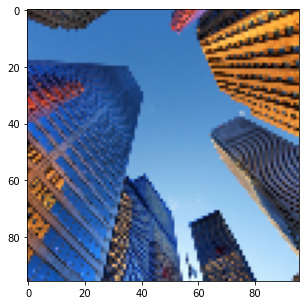

In [ ]:
####working code 
# test = data['L'][2].cpu().permute(1,2,0)
# # t_nimg = torch.from_numpy(new_img)
# print(test.shape)
# plt.imshow(test)

from PIL import Image
fig= plt.figure(figsize=(5, 5))
tf = transforms.Compose([transforms.CenterCrop((96,96)),transforms.ToTensor()])
test_dataset_hr = torchvision.datasets.ImageFolder(root='C:/Users/n_babar/Desktop/SR/Project/test_response3/input_HR_scale', transform=tf)
test_loader = DataLoader(test_dataset_hr,batch_size=5 , shuffle=False)
print(test_loader.batch_size)
for idx,(data,labels) in tqdm(enumerate(test_loader)):
    ##print(x)
    data = data.cpu()
    with torch.no_grad():
        model = model.cpu()
        td=model(data)
inpt = data[0] 
print(inpt.shape)
test_d = td[0]
# test_d = test_d[1,:]
print(test_d.shape)
test_d = test_d.permute(1,2,0)
test_d = test_d.cpu().detach().numpy()
    
test_d = test_d.reshape((11,11))
# print(test_d.shape)
test_d = np.clip(test_d, 0, 1)
# print(test_d.shape)
output = (test_d * 255.0).round().astype(np.uint8)
final_img = Image.fromarray(output)
print(final_img.size)
save_path = 'C:/Users/n_babar/Desktop/SR/Project/test_response3/output_kernels'
final_img.save(save_path+'/'+'0.1'+'.png')
# ax[0].imshow(final_img)
plt.imshow(inpt.permute(1,2,0))
    
# 	img  = Image.fromarray(output)
# Saving the image
    # final_img.save(save_path+'/'+
	
    
    # # plt.imshow(t_nimg.permute(1,2,0))
    
    

    




# for idx, (img,label) in tqdm(enumerate(test_loader)):
#     img = img.to(device)
# 	with torch.no_grad():
# 		l = model_1(img)
# 	image = l
# 	image = torch.squeeze(image)
# 	image = image.permute(1,2,0)
# 	image = image.cpu().detach().numpy()
# 	image = np.clip(image, 0, 1)
# 	output = (image * 255.0).round().astype(np.uint8)
# 	img  = Image.fromarray(output)
# 	# Saving the image
# 	img.save(save_path + '/' + img_name[idx])
# # plt.imshow(t_nimg.permute(1,2,0))

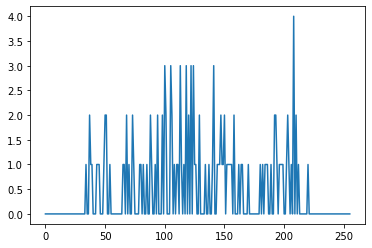

In [ ]:
import cv2
k = cv2.imread("C:/Users/n_babar/Desktop/SR/Project/test_response3/output_kernels/0.1.png",0)
# print(k.dtype)
histr = cv2.calcHist([k],[0],None,[256],[0,256])
plt.plot(histr)
plt.show()

In [ ]:
import cv2
k = cv2.imread("C:/Users/n_babar/Desktop/SR/Project/test_response3/input_HR_scale/1/001.png",0)
k.shape

(128, 171)

In [ ]:
# for data in train_loader:
#     ##print(x)
#     data= data.to('cuda:0')
#     # print(x.shape)
#     break

# # image = image.to('cpu'
# inputs = data
# # print(inputs.shape)
# y = model(inputs)
print(outputs.shape) 
print(train.shape)

torch.Size([16, 121, 1, 1])
torch.Size([16, 3, 96, 96])


In [ ]:
#testing images :
from torchvision.io import read_image
import torchvision.transforms as T
import numpy as np

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")


model.to(device)
# read a PNG image
img = read_image('C:/Users/n_babar/Desktop/SR/Project/test_response3/response3_LR/001._Set__kernel_label_1.png')
print(img.shape)
img = img.to(device)
# img = T.ToPILImage()(img)
img = img.array(img)

transform = transforms.Compose([transforms.CenterCrop((96,96)),transforms.ToTensor()])
tensork = transform(img)
print(tensork.shape)

# output_test = model(tensork)

torch.Size([3, 128, 171])


AttributeError: 'Tensor' object has no attribute 'array'

## code to copy all the images in one folder 

In [ ]:
data_set_1 = DatasetSR()




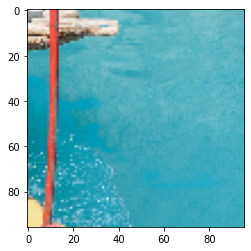

In [ ]:
import matplotlib.pyplot as plt 
plt.imshow(data['H'][3].cpu().permute(1,2,0))


In [ ]:
#### extracting the labels from the title of the images 


str1 = "0001_Set__kernel_4.png"
str2 = str1[len(str1)-5]
print(str2)

4


In [ ]:
plt.imshow(x['L'].cpu().permute(1,2,0))

RuntimeError: number of dims don't match in permute

In [ ]:
# data_Set = DatasetSR()
# print(len(data_Set))
# print(len(data_set))

import shutil
from tqdm.auto import tqdm
RootDir1 = r'C:\Users\n_babar\Desktop\SR\Project\train_model\DIV2K_GRND_SCALE'
TargetFolder = r'C:\Users\n_babar\Desktop\SR\Project\train_model\DIV2K_Ensemble_GRND'
for root, dirs, files in tqdm(os.walk((os.path.normpath(RootDir1)), topdown=False)):
        for name in files:
            if name.endswith('.png'):
                #print('found')
                SourceFolder = os.path.join(root,name)
                shutil.copy2(SourceFolder, TargetFolder) #copies csv to new folder

0it [00:00, ?it/s]

### Creating the datasets 

In [ ]:
#Set Device to Cuda
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
num_classes = 6
data_set_1 = DatasetSR()

# train_loader = DataLoader(data_set_1[x['L']],batch_size=16, shuffle=False)

# length = len(data_set_1)
# print(length)


cuda:0


In [ ]:
###creating of the datasets 

#Set Device to Cuda
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
num_classes = 6

#*********************** A. Data Preparation and Processing State **************************

#converting db images to tensors 
# tf = transforms.Compose([Random_Crop(),transforms.ToTensor()])
tf = transforms.Compose([transforms.CenterCrop((96,96)),transforms.ToTensor()])
# Load data from the root directory and label the data as:
# {'DIV2K_train_Set_1': 0, 'DIV2K_train_Set_2': 1, 'DIV2K_train_Set_3': 2, 'DIV2K_train_Set_4': 3, 'DIV2K_train_Set_5': 4}

train_dataset = torchvision.datasets.ImageFolder(root='C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_LR', transform=tf)
# train_dataset = DatasetSR()
data_set_1 = DatasetSR()
valid_dataset = torchvision.datasets.ImageFolder(root='C:/Users/n_babar/Desktop/SR/Project/valid_model/DIV2K_LR', transform=tf)
grnd_truth_dataset = torchvision.datasets.ImageFolder(root='C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_GRND_SCALE', transform=tf)
###training data -----
# train_dataloader = DataLoader(training_data, batch_size=64, shuffle=True)
train_loader = DataLoader(train_dataset, batch_size=16, shuffle=False)
valid_loader = DataLoader(valid_dataset, batch_size=16, shuffle= False) 
grnd_loader =  DataLoader(grnd_truth_dataset, batch_size=16, shuffle=False)
#transforms.resize(480,680)

print(train_dataset.class_to_idx) #Uncomment to print the labels of the corresponding dataset
print(grnd_truth_dataset.class_to_idx)

length = len(train_dataset)
print(length)
l_grnd = len(grnd_truth_dataset)
print(l_grnd)


cuda:0
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 4, '6': 5}
{'1': 0, '2': 1, '3': 2, '4': 3, '5': 4, '6': 5}
800
800


In [ ]:
for data in train_loader:
    ##print(x)
    x= data
   
    break
    
x = x.to('CUDA')
output = model(x)

AttributeError: 'list' object has no attribute 'to'

In [ ]:
# from  matplotlib import pyplot as plt 

# Display image and label.
train_features, train_labels = next(iter(train_loader))
print(f"Feature batch shape: {train_features.size()}")
print(f"Labels batch shape: {train_labels.size()}")
img = train_features[0].squeeze()
label = train_labels[6]
print(f"Label: {label}")

Feature batch shape: torch.Size([16, 3, 96, 96])
Labels batch shape: torch.Size([16])
Label: 0


#### Model 

In [ ]:
###Residual block ######

class BasicResidualBlock(nn.Module): 
    def __init__(self,channel_num):
        super(BasicResidualBlock,self).__init__()
        ## 3 * 3 kernel conv 
        #input and output channels == channel_num
        self.conv_block1 = nn.Sequential(nn.Conv2d(channel_num, channel_num ,3, padding=1),
                                         nn.BatchNorm2d(channel_num),nn.ReLU())
        self.conv_block2 = nn.Sequential(nn.Conv2d(channel_num, channel_num, 3, padding=1),
                                         nn.BatchNorm2d(channel_num))
        self.relu = nn.ReLU()
        self.maxpool = torch.nn.MaxPool2d(kernel_size = 3,padding = 1)
		 
              
    def forward(self,x): 
          
            ##forward 
            residual = x
            x = self.conv_block1(x)
            x = self.conv_block2(x)
            x = x + residual 
            x = self.relu(x)
            out = self.maxpool(x)
           
            return out 

In [ ]:
##Functional KES net 

class KES_Net(torch.nn.Module):
    def __init__(self):
        super(KES_Net, self).__init__()
        
        ##first block is the convolution ---size of 
        self.block_1 = nn.Sequential(nn.Conv2d(in_channels=3, out_channels=64, kernel_size=3, padding=1),
                                    nn.ReLU(),nn.BatchNorm2d(64))                   
        
        self.BasicResidualBlock = nn.ModuleList([BasicResidualBlock(channel_num=64) for i in range(8)])
        # self.maxpool = torch.nn.MaxPool2d(kernel_size = 3,padding = 1)
        self.block_3 =  torch.nn.Sequential(torch.nn.Conv2d(in_channels =64,out_channels=256,kernel_size=1),
                                            torch.nn.BatchNorm2d(256),
                                            torch.nn.ReLU(inplace=True)
                                           )
        self.block_4 =  torch.nn.Sequential(torch.nn.Conv2d(in_channels =256,out_channels=128,kernel_size=1),
                                            torch.nn.BatchNorm2d(128),
                                            torch.nn.ReLU(inplace=True)
                                           )
        self.block_5 =  torch.nn.Sequential(torch.nn.Conv2d(in_channels =128,out_channels=121,kernel_size=1),
                                            torch.nn.BatchNorm2d(121),
                                            torch.nn.Sigmoid()
                                           )
        # self.fc2 = nn.Linear(121,1)
        
    def forward(self,x):
        x = self.block_1(x)
        for i, __ in enumerate(self.BasicResidualBlock):
            x = self.BasicResidualBlock[i](x)
       ##global average pooling  
        #x = x.mean(dim=(-2, -1))
            
        x = self.block_3(x)
        x = self.block_4(x)
        x = self.block_5(x)
        # x = self.fc2(x)
        
        return x

In [ ]:
model = KES_Net()
model.to(device)

error = nn.CrossEntropyLoss()

learning_rate = 1e-4 
error = nn.L1Loss()
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate) # Code to use the Adam Optimizer
#optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)
#scheduler = MultiStepLR(optimizer, milestones=[2000 * 200], gamma=0.5) #milestones=[Intended Epoch * Batch Size]
# print(model)





In [ ]:
from torch.optim.lr_scheduler import MultiStepLR
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)
model = KES_Net()
model.to(device)

# error = nn.L1Loss()

learning_rate = 1e-4 
optimizer = torch.optim.Adam(model.parameters(), lr=learning_rate) # Code to use the Adam Optimizer
#optimizer = torch.optim.SGD(model.parameters(), lr=learning_rate)
scheduler = MultiStepLR(optimizer, milestones=[100000, 160000, 180000, 192000, 200000], gamma=0.5) #milestones=[Intended Epoch * Batch Size]
# print(model)

cuda:0


In [ ]:
import torch.nn.functional as F
num_epochs = 300 #5000 after half divide lr by 2
count = 0
# Lists for visualization of loss and accuracy 
loss_list = []
iteration_list = []
accuracy_list = []

# Lists for knowing classwise accuracy
predictions_list = []
labels_list = []

count = 0 
optimizer = torch.optim.SGD(model.parameters(), lr =0.0001 , momentum =0.5)
# num_epochs = 50
learning_rate = 0.1


def wiener_loss_function(image,kernel,grnd_img):
    transform = transforms.ToTensor()
    rng = np.random.default_rng()
    ##input image for the network
    image = image.to('cpu')
    image = image.detach().numpy()
    image = image[1,:]
    image = image.reshape((96,96,3))
    image = color.rgb2gray(image)
    image += 0.1 * image.std() * rng.standard_normal(image.shape)
    image = image.astype(object)
    ####this is for the kernel ----reshaping from 121,1 to 11,11
    kernel = kernel.to('cpu')
    kernel = kernel.detach().numpy()
    kernel = kernel[1,:]
    kernel = kernel.reshape((11,11))
    kernel = kernel.astype(object)
    # deconv_img = restoration.wiener(image, kernel,0.0001)
    ##deconvoluting the image with the filter ---requiring 
    deconv_img, _ = restoration.unsupervised_wiener(image, kernel)
    deconv_tensor = transform(deconv_img)
    deconv_tensor = torch.tensor(deconv_tensor,requires_grad=True)
    deconv_tensor = deconv_tensor.type(torch.DoubleTensor)
    ##ground  image --from the g_inputs 
    grnd_img = grnd_img.to('cpu')
    grnd_img = grnd_img[1,:]
    grnd_img = grnd_img.reshape((96,96,3))
    grnd_img = color.rgb2gray(grnd_img)
    grnd_img_tensor = transform(grnd_img)
    grnd_img_tensor=grnd_img_tensor.type(torch.DoubleTensor)
    # print(grnd_img)
    # plt.imshow(grnd_img)
    mse_loss = nn.MSELoss()
    loss = mse_loss(deconv_tensor,grnd_img_tensor)
    loss = loss.type(torch.DoubleTensor)
    print(loss)
    return loss


for epoch in tqdm(range(num_epochs)):
    running_loss =0.0
    # for i,data in enumerate(train_loader, 0):
    for index, ((img,lab_t),(img1,lab_g)) in tqdm(enumerate(zip(train_loader,grnd_loader))):
        ##getting the inputs; data is a list of [inputs,labels] 
        
        # inputs , labels = data
        # inputs , labels = inputs.cuda(), labels.cuda()
        
        ##input images for the train loader
        images_input = img.to(device)
        train = Variable(images_input)
        
        ##ground loader
        ground = Variable(img1.to(device))        

        # zero the parameter gradients 
        optimizer.zero_grad()
        
        # forward + backward + optimize 
        outputs = model(images_input)
        loss = wiener_loss_function(train,outputs,ground)
        # Initializing a gradient as 0 so there is no mixing of gradient among the batches
        optimizer.zero_grad()
        
        #Propagating the error backward
        loss.backward()
        
        # Optimizing the parameters
        optimizer.step()
        # scheduler.step()
        count += 1
        # loss.backward()
        # optimizer.step() 
        
        
        
        count += 1
#         running_loss += loss.item()
#         print ('iteration : {}, No. of Epochs [{}/{}],Learning rate :  Loss: {:.4f}'.format(count,epoch+1, num_epochs,learning_rate,loss.item()))
# print('Finished Training')
        if (count % 800 == 0):
            print("Iteration: {}, Loss: {}%, Learning Rate: {}, epoch: {}".format(count, loss.data,scheduler.get_last_lr(),epoch))
            loss_list.append(loss.data)
            iteration_list.append(count)
        if epoch % 5 == 0 or epoch ==num_epochs - 1 :
            torch.save(model.state_dict(), os.path.join("C:/Computer_Vision/Nashra_486515/Super_resolution_project/KES_Net", 'KES_Net' + str(epoch) + '.pth'))
                                                               


  0%|          | 0/300 [00:00<?, ?it/s]

NameError: name 'train_loader' is not defined

#### loading the inputs to the model and  finding the result 

In [ ]:
for idx,(data,labels) in enumerate(train_loader):
    ##print(x)
    data, labels = data.cuda(), labels.cuda()
    # print(x.shape)
    break


inputs = data
# print(inputs.shape)
y = model(inputs)

print(y.shape)
y=y[1,:]
y= y.reshape((11,11))

# print(y)
# labels = torch.argmax(y, 1)
g=read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_1.png')

NameError: name 'train_loader' is not defined

In [ ]:
import numpy as np
from skimage import color, data, restoration
import torch.nn as nn
import torch


def wiener_loss_function(image,kernel,grnd_img):
    transform = transforms.ToTensor()
    rng = np.random.default_rng()
    ##input image for the network
    image = image.to('cpu')
    image = image.detach().numpy()
    image = image[1,:]
    image = image.reshape((96,96,3))
    
    image = color.rgb2gray(image)
    print(image.shape)
    image += 0.1 * image.std() * rng.standard_normal(image.shape)
    image = image.astype(object)
    ####this is for the kernel ----reshaping from 121,1 to 11,11
    kernel = kernel.to('cpu')
    kernel = kernel.detach().numpy()
    kernel = kernel[1,:]
    kernel = kernel.reshape((11,11))
    kernel = kernel.astype(object)
    # deconv_img = restoration.wiener(image, kernel,0.0001)
    ##deconvoluting the image with the filter ---requiring 
    deconv_img, _ = restoration.unsupervised_wiener(image, kernel)
    deconv_tensor = transform(deconv_img)
    deconv_tensor = torch.tensor(deconv_tensor,requires_grad=True)
        
    ##ground  image --from the g_inputs 
    grnd_img = grnd_img.to('cpu')
    grnd_img = grnd_img[1,:]
    grnd_img = grnd_img.reshape((96,96,3))
    grnd_img = color.rgb2gray(grnd_img)
    grnd_img_tensor = transform(grnd_img)
    # print(grnd_img)
    # plt.imshow(grnd_img)
    mse_loss = nn.MSELoss()
    loss = mse_loss(deconv_tensor,grnd_img_tensor)
    print(loss)
    return loss

In [ ]:
from torchvision.utils import save_image
x = model(inputs)
print(inputs.shape)
print(x.shape)
x = x.to('cpu')
x = x[1,:]
# print(x.shape)

x = x.reshape((11,11))
# kernel = kernel.astype(object)
save_image(x, 'img1.png')
print(x.shape)

# print(x.shape)
# plt.imshow(x)
# b = read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_1.png')
# print(b.shape)

torch.Size([4, 3, 96, 96])
torch.Size([4, 121, 1, 1])
torch.Size([11, 11])


## Loss function ####

In [ ]:
###defination for the loss function which is ---weiner deconvolution comparing the images and the kernels and sending the deconvolved image and the image is compared iwth the ground truth
import numpy as np
from skimage import color, data, restoration
import torch.nn as nn
import torch


def wiener_loss_function(image,kernel,grnd_img):
    # print(label)
    # kernel = output_label(label)
    transform = transforms.ToTensor()


    rng = np.random.default_rng()
    image = image.to('cpu')
    image = image.detach().numpy()
    # image = color.rgb2gray(image)
    # kernel=model(image)
    image = image[1,:]
    image = image.reshape((96,96,3))
    # image = image[0,:,:]   
    image = color.rgb2gray(image)
    image += 0.1 * image.std() * rng.standard_normal(image.shape)
    #image = color.rgb2gray(image)
    image = image.astype(object)
    print(image.shape)
    # plt.imshow(image)
    #print(kernel.size())

    ##the below kernel psf is just for the testing purpose -------
    # psf = np.ones((5, 5)) / 25
    kernel = kernel.to('cpu')
    kernel = kernel.detach().numpy()
    kernel = kernel[1,:]
    kernel = kernel.reshape((11,11))
    kernel = kernel.astype(object)
    # deconv_img = restoration.wiener(image, kernel,0.0001)
    deconv_img, _ = restoration.unsupervised_wiener(image, kernel)
    deconv_tensor = transform(deconv_img)
    deconv_tensor = torch.tensor(deconv_tensor,requires_grad=True)
    # print(deconv_img)
    # plt.imshow(deconv_img)
    
    
    grnd_img = grnd_img.to('cpu')
    grnd_img = grnd_img[1,:]
    grnd_img = grnd_img.reshape((96,96,3))
    grnd_img = color.rgb2gray(grnd_img)
    grnd_img_tensor = transform(grnd_img)
    # print(grnd_img)
    # plt.imshow(grnd_img)
    mse_loss = nn.MSELoss()
    loss = mse_loss(deconv_tensor,grnd_img_tensor)
    print(loss)
    return loss
    # loss = loss_fn(deconv_img,grnd_img)
    # print(loss)
    # return loss
    
    # deconv_img = restoration.wiener(image,psf,0.01)
    #deconvolved, _= restoration.unsupervised_wiener(image.detach().numpy(),kernel.detach().numpy())
    
    # return deconv_img

# def loss_function(image,kernel,grnd_img):
#     d_img = wiener_filter(image,kernel)
#     grnd_img = img.to('cpu')
#     grnd_img = grnd_img[0,:,:]
#     print(grnd_img.shape)
#     loss = torch.mean((d_img - grnd_img)**2)
#     return loss 
    
    



# def output_label(labels):
#         output_mapping = {
#                  1: read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_1.png'),
#                  2: read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_2.png'),
#                  3: read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_3.png'),
#                  4: read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_4.png'),
#                  5: read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_5.png'), 
#                  0: read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_0.png'), 
#                  }
#         input = (labels.item() if type(labels) == torch.Tensor else labels)
#         return output_mapping[input]


In [ ]:
# k = read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_4.png')
# k = k .reshape((11,11))
# print(k.shape)

from skimage import color, data, restoration
import torch
demo = g_inputs
demo = demo.to('cpu')
demo = demo[1,:]
demo = demo.reshape((96,96,3))
demo = color.rgb2gray(demo)
transform = transforms.ToTensor()
tensor_1 = transform(demo)
tensor_1 = torch.tensor(tensor_1,requires_grad=True)
# print(demo.shape)
# plt.imshow(demo)


C:\Users\n_babar\AppData\Local\Temp/ipykernel_37316/225340551.py:14: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  tensor_1 = torch.tensor(tensor_1,requires_grad=True)


In [ ]:
# import matplotlib as plt
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg



for i,data in enumerate(train_loader):
        ##getting the inputs; data is a list of [inputs,labels] 
        
        t_inputs , t_labels = data
        t_inputs , t_labels = g_inputs.to(device), g_labels.to(device)
        break
        
for i,data in enumerate(grnd_loader):
        ##getting the inputs; data is a list of [inputs,labels] 
        
        g_inputs , g_labels = data
        g_inputs , g_labels = g_inputs.cuda(), g_labels.cuda()
        break
               
    
img_input = t_inputs
# print(img_input.shape)
# image = img_input[1,:]
# image = img_input[0,:,:] 
# image = image.to('cpu')
# image = rgb2gray(image)
img_k = model(img_input)
# print(img_k.shape)
img_2 = g_inputs
# print(img_2.shape)
error = wiener_loss_function(img_input,img_k,img_2)
# print(image.shape)
# plt.imshow(img_2)



##for the ground image 
# c = g_inputs[0]
# plt.imshow(c.cpu().permute(1,2,0))


(96, 96)
tensor(0.2848, dtype=torch.float64, grad_fn=<MseLossBackward0>)


C:\Users\n_babar\AppData\Local\Temp/ipykernel_37316/3315591315.py:40: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  deconv_tensor = torch.tensor(deconv_tensor,requires_grad=True)


In [ ]:
for i,data in enumerate(train_loader):
        ##getting the inputs; data is a list of [inputs,labels] 
        
        t_inputs , t_labels = data
        t_inputs , t_labels = g_inputs.to(device), g_labels.to(device)
        break  
        img_1 = t_inputs

# img_1 = img_1[1,:]
# print(img_1.shape)
# img_1 = img_1[None,:]
# print(img_1.shape)

x = model(img_1)

print(x.shape)
img_1 = img_1[1,:]
# ##the working code is down 
img_1 = img_1[0,:,:]
# #img_1 = img_1[:, :, 0]*0.299 + img_1[:, :, 1]*0.587 + img_1[:, :, 2]*0.114
print(img_1.shape)

# img_1 = color.rgb2gray(img_1)
x = x[1,:]
# print(x.shape)

x = x.reshape((11,11))
# print(x.shape)
print(x.shape)
c = g_inputs[0]
 

#print(x.shape)

# kernel = output_label(1)
error = loss_function(img_1,x)
# error = wiener_filter(img_1,x)
plt.imshow(error)
print(error.shape)
#print(error)



NameError: name 'img_1' is not defined

In [ ]:
import matplotlib.pyplot as plt

In [ ]:
##criterion = nn.L1Loss()
count = 0 
optimizer = torch.optim.SGD(model.parameters(), lr =0.0001 , momentum =0.5)
num_epochs = 50
learning_rate = 0.1
for epoch in range(num_epochs):
    for idx,((img,lab),(orig,lab1)) in tqdm(enumerate(zip(train_loader,grnd_loader))):
        ##getting the inputs: data is a list of [inputs,labels] 
        images = img.to(device)
        train = Variable(images)
        gt_images = orig.to(device)
        
        # Forward pass -----
        outputs = model(train)
        
        #calculating the loss----- 
        
        
        
        
        
        
        
        
        
        
        
        
        
        
        
        
        
        
        
        

## testing for the response 3

In [ ]:
#test dataset

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)


import numpy as np
import matplotlib.pyplot as plt
import imageio as iio
import cv2
import torch
import torchvision.transforms as transforms
# read an image
#img = iio.imread("baby.bmp")
# img = cv2.imread('C:/Users/n_babar/Desktop/SR/Project/test_response3/response3_LR/001._Set__kernel_label_1.png')
# img = np.array(img)
# #img = cv2. resize(img, dsize=(513, 511), interpolation=cv2.INTER_CUBIC) #
# print(img.shape)
# img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# plt.imshow(img)
# type(img)
# trans = transforms.Compose([
#     transforms.ToTensor()])

# # image = tf.image.convert_image_dtype(img, tf.float32) # equivalent to dividing image pixels by 255
# # image = tf.image.resize(img, (3,96,96)) 
# tensork.reshape((96,96,3))
# # output_test = model(

k = read_image("C:/Users/n_babar/Desktop/SR/Project/test_response3/response3_LR/001._Set__kernel_label_1.png")
print(k.shape)
k =  np.array(k)
# transform = transforms.Compose([transforms.CenterCrop((96,96))])
transform = transforms.Compose([transforms.CenterCrop((96,96)),transforms.ToTensor()])
tensork = transform(k)

tensork.reshape((96,96,3))
print(tensork.shape)
# k = color.rgb2gray(data.astronaut())




cuda:0
torch.Size([3, 128, 171])


TypeError: Unexpected type <class 'numpy.ndarray'>

In [ ]:
c = inputs[0]
print(c.size())
plt.imshow(c.cpu().permute(1,2,0))


NameError: name 'inputs' is not defined

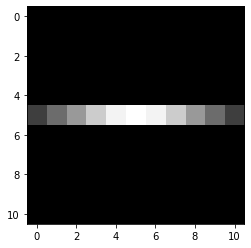

In [ ]:


##displaying any tensor  image !! 
import matplotlib.pyplot as plt 
plt.imshow(b.cpu().permute(1,2,0))



In [ ]:
import numpy as np 
import matplotlib.pyplot as plt 


from skimage import color , data,restoration 
rng = np.random.default_rng()

In [ ]:
import torchvision.transforms as T



In [ ]:
###LOSS CALCULATION 


##converting the list of the output to the list of numpy array first ---> 
def output_label(labels):
        output_mapping = {
                 0: read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_1.png'),
                 1: read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_2.png'),
                 2: read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_3.png'),
                 3: read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_4.png'),
                 4: read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_5.png'), 
                 5: read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_6.png'), 
                 }
        
        input = (labels.item() if type(labels) == torch.Tensor else labels)
        return output_mapping[input]

        
class WeinerDeconv(nn.modules.Module):
    def __init__(self):
        super(WeinerDeconv,self).__init__()
        
    def forward(self,output,labels):
        output = output.reshape((11,11))
        input_label = output_label(labels) ###expected labels ---original values of the kernels 
        input_label = input_label.reshape((11,11))
        loss = torch.mean((output - input_label)**2)
        return loss 
# size of the tensor was ([121,1,1]) ---reshaping was required (11,11) same with the original LR images as they were ([1,11,11])

###debugging 

a = outputs[0]
# print(a.size())
c = labels[0]
# print(a.reshape((11,11)))
print(c)
error = WeinerDeconv(a,c)
print(error)


tensor(5, device='cuda:0')


TypeError: __init__() takes 1 positional argument but 3 were given

In [ ]:
#outputs 
# import numpy as np 
# import matplotlib.pyplot as plt
# from torchvision.utils import save_image
# # index = output.cpu().data.numpy().argmax()
# ##reshaping the output 
# a = outputs[0]
# b = a.reshape((11,11))
# # C:\Users\n_babar\Desktop\SR\Project\train_model\DIV2K_kernels
# c = labels
# print(b.shape)

# def output_label(labels):
#     output_mapping = {
#                  0: read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_1.png'),
#                  1: read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_2.png'),
#                  2: read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_3.png'),
#                  3: read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_4.png'),
#                  4: read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_5.png'), 
#                  5: read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_6.png'), 
#                  }
#     input = (labels.item() if type(labels) == torch.Tensor else labels)
#     return output_mapping[input]

# img_out = output_label(0).reshape((11,11))


# def weiner_Deconv_loss(outputs,labels):
#     output=torch.tensor(outputs().reshape((11,11)))
#     input_label = output_label(labels()).reshape((11,11))
#     loss = torch.mean((output - input_label)**2)
#     return loss 

# error= weiner_Deconv_loss(b,img_out)
     

In [ ]:
#validation accuracy 

correct = 0 
total = 0 
with torch.no_grad():
    for data in valid_loader:
        images , labels = data 
        images , labels = images.cuda(), labels.cuda()
        outputs = model(images)
        _, predicted = torch.max(outputs.data,1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        
print('Accuracy of the network on the test i"mages : %d %%' % (
    100 * correct /total))

Accuracy of the network on the test i"mages : 10 %


In [ ]:
num_epochs =200
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
import gc
total_step = len(train_loader)
error = nn.L1Loss()

for epoch in range(num_epochs):
    for i, (images, labels) in enumerate(train_loader):  
        # Move tensors to the configured device
        images = images.to(device)
        labels = labels.to(device)
        
        # Forward pass
        outputs = model(images)
        loss = error(outputs, labels)
        # loss = error(outputs, check)
        
        # Backward and optimize
        optimizer.zero_grad()
        loss.backward()
        optimizer.step()
        del images, labels, outputs
        torch.cuda.empty_cache()
        gc.collect()

    print ('Epoch [{}/{}], Loss: {:.4f}'.format(epoch+1, num_epochs, loss.item()))

In [ ]:
torch.save(model.state_dict(), os.path.join("C:/Users/n_babar/Desktop/SR/Project/model", 'KES_Net' + str(200) + '.pth'))

Demo checkin for the wiener color ---deconvolution




In [ ]:
#c is the image
from scipy.signal import convolve2d as conv2
c = t_inputs
k = read_image("C:/Users/n_babar/Desktop/SR/Project/kernel_estimation/0064_Set__kernel_label_4.png")
print(k.dtype)
k = k.to('cpu')
transform = transforms.Compose([transforms.CenterCrop((96,96))])
# transform =transforms.Compose([transforms.CenterCrop((96,96)),transforms.ToTensor()])
tensork = transform(c)

# tensork.reshape((96,96,3))
print(tensork.shape)
# k = color.rgb2gray(data.astronaut())
# tensork=tensork[1,:]
# t_inputs = t_inputs[1,:]
# t_inputs = t_inputs.reshape((96,96,3))
# t_inputs = t_inputs[1,:]
# print(c.size())
# c = c.cpu()
# # plt.imshow(c.cpu().permute(1,2,0))
# c = c[1,]
# print(c.shape)
# #k is the k
# k = read_image('C:/Users/n_babar/Desktop/SR/Project/train_model/DIV2K_kernels/kernel_4.png')
# k = k .reshape((11,11))
# k=k.cpu()
# print(k.shape)
# print(t_inputs.shape)
# new_img = conv2(c,k,'same')
# x=model(k)
# print(x.shape)
# g_ipuput = 
# deconvolved, _ = restoration.unsupervised_wiener(t_inputs,x,is_real=True, clip=True)
'''fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(8, 5),
                        sharex=True, sharey=True)

ax[0].imshow(c)
ax[1].imshow(new_img)
ax[2].imshow(x)'''


torch.uint8


TypeError: Tensor is not a torch image.